 # End-to-End Mulit-Class Dog Breed Classifiction

 This notebook bulids an end-to-end multi-class image classifier using TensorFloow 2.0 and TensorFlow Hub.

 ## 1. Problem

 Identifying the breed of  a dog given an image of a dog.
 
 when I am sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is..

 ## 2. Data

The Data we're using is from Kaggle's dog breed identification competition..

https://www.kaggle.com/competitions/dog-breed-identification/


 ## 3. Evaluation

 The Evaluation is afile with prediction probabilities for each dog breed of each test image.

 https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

 ## 4. Features

 Some  information about the data:
 * we're dealing with images (unstructured data) so it's probably best we use deep learning/ transfer learning..
 * There are 120 breeds of dogs (this means there are 120 different classes)..
 * There are around 10k+ images in the traininng set (these images have labels)..
 * there are around 10k+ images in test set (these images have no labels, because we'll want to predict them)..
 

In [ ]:
#unzip the uploaded data into Google Drive
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

# Get our workspace ready

* import TensorFlow 2.x 
* import TensorFlow Hub
* Make sure we're using a GPU


In [ ]:
# Import necessary tools 
import tensorflow as tf
import tensorflow_hub as hub
print('TF Version', tf.__version__)
print('TF Hub version', hub.__version__)

# Check for GPU availability 
print('GPU', 'available (YESSSS!!!)' if tf.config.list_physical_devices('GPU') else 'not available :(')

TF Version 2.8.2
TF Hub version 0.12.0
GPU available (YESSSS!!!)


## Getting our data ready (Turning into Tensors)

with all machine learning models, our data has to be in numerical format. so that's what we'll be doing first.. turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels..

In [ ]:
#Checkoout the labels of our data
import pandas as pd
labels_csv = pd.read_csv('drive/MyDrive/Dog Vision/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


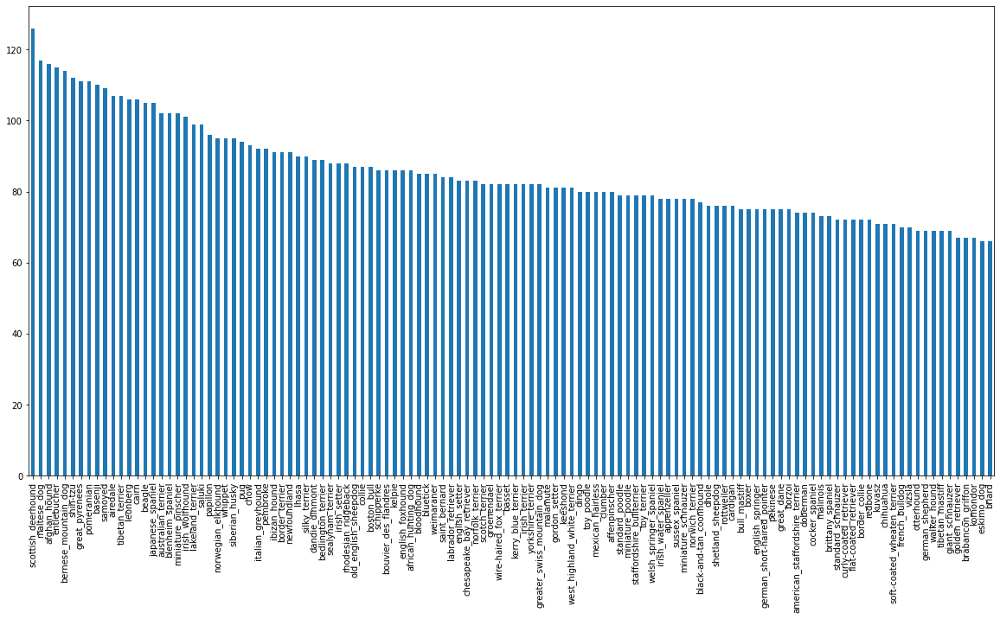

In [ ]:
#how many images are there of each breed?
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

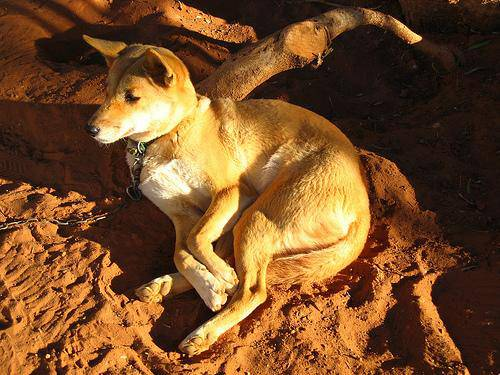

In [ ]:
#let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames..

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#create pathnames from image ID's

filenames = ['drive/MyDrive/Dog Vision/train/'+fname+'.jpg' for fname in labels_csv['id']]

filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
#check whether number of filenames matches number of actual image files
import os 
if len(os.listdir('drive/MyDrive/Dog Vision/train/')) == len(filenames):
  print("Filenames match actual amount of files!!! Please Proceed..")
else:
  print("Filenames do not match actual amount of files, check the target directory..")

Filenames match actual amount of files!!! Please Proceed..


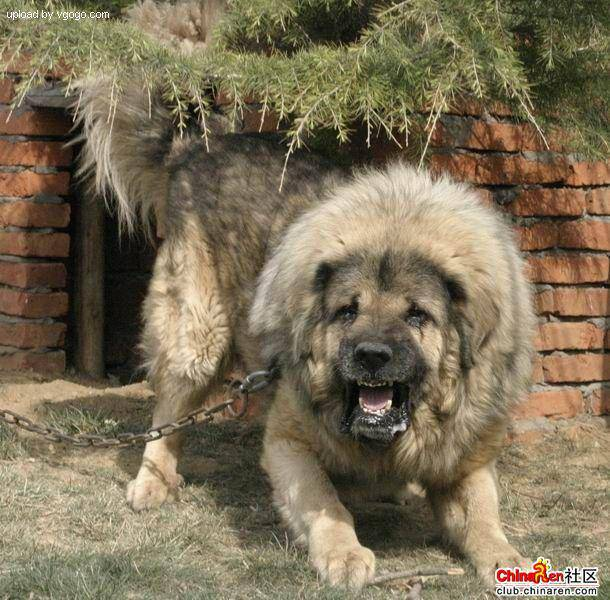

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv['breed'][9000]

'tibetan_mastiff'

Since we have now our traininng image filepaths in a list,

let's prepare our labels..

In [ ]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
#labels = np.array(labels) #does same thing as above 
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
#see if nummbers of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Numbers of Labels matches number of filename!")
else:
  print("Numbers of Labels does not matches number of filename!, please check data directories!!")
  

Numbers of Labels matches number of filename!


In [ ]:
#find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
#Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels 


[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
#Example Turining Boolean array into integers
print(labels[0]) #original label
print(np.where(unique_breeds == labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in bollean array
print(boolean_labels[0].astype(int)) #there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

Since the dataset from Kaggle doesn't come with a validation set.. so we're going to create our own

In [ ]:
#setup x & y variables
x = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

we're going to start off experimenting with ~1000 images and increase as needed

In [ ]:
#set number of images to use for experimenting
NUM_IMAGES = 2000 #@param {type:'slider', min:1000, max:10000, step:1000}
NUM_IMAGES

2000

In [ ]:
#let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

#Split them into training and validation of total size NUM_IMAGES 
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2, 
                                                  random_state=42)

len(x_train), len(y_train), len(x_val), len(y_val)

(1600, 1600, 400, 400)

In [ ]:
#let's have a geer at the training data
x_train[:2], y_train[:2]

(['drive/MyDrive/Dog Vision/train/17c5e8815cf0d086090a07b003b9b036.jpg',
  'drive/MyDrive/Dog Vision/train/0593e37870ee77b0d34508e118bf6670.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
          True, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

## Preprocessing Images (Turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and savve it to a variable, `image`
3. Turn our image (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1..)
5. Resize the image to be a shape of (244,244)
6. Retrun the modified `image`

Before we do, let's see what importing an image looks like..

In [ ]:
#convert image to Numpy 
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, Let's make a function to preprocess them.

In [ ]:
#Define image size
IMG_SIZE = 224

#create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  '''
    Takes an image file path and turns the image into a Tensor..
  '''

  #read in an image file 
  image = tf.io.read_file(image_path)
  #turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  #conver the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  #Resize the image to our desired value (244, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## Turning our data into batches

Why turn our data into batches ?

Let's say you're trying to process 10k+ images in one go.. they all might not fit into memory.

so that's why we do about 32 (this is batch size) images at a time (you caan manually adjust the batch sizze if need be).

In order to ouse TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: `(image, label)`

In [ ]:
#create a simple function to retrun a tuple (image, label)
def get_image_label(image_path, label):
  '''
  Takes an image file path and the assosciated label,
  processes the image and return a tuple of (image, label)
  '''
  image = process_image(image_path)
  return image, label

In [ ]:
#Demo of the above 
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form : `(image, label)`, let's make a function to turn all of our data (`x & y`) into batches!!

In [ ]:
#define the batch size, 32 is a good start
BATCH_SIZE = 32

# create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data..
  Also accepts test data as input (no labels)
  '''
  #if the data is a test dataset, weprobably don't have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))  # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  #If the data is valid dataset , we don't need tto shuffle it
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))  # filepaths & labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
     print('Creating Training data batches...')
     #Turn filepaths and labels into Tensors
     data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))  # filepaths & labels

     # Shuffling pathnames and labels before mapping image preprocessor function is faster than Shuffling images
     data = data.shuffle(buffer_size=len(x))

     #create (image, label) tuples (this also turns the image path into a preprocessed image)
     data = data.map(get_image_label)

     data_batch = data.batch(BATCH_SIZE)

     return data_batch

  

In [ ]:
#create training and validation data batches
train_data = create_data_batches(x_train,y_train)
val_data = create_data_batches(x_val,y_val, valid_data=True)

Creating Training data batches...
Creating validation data batches...


In [ ]:
#check out the difference attribute of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however,  these can be a little hard to understand/comprehend, let''s visulize them!!


In [ ]:
import matplotlib.pyplot as plt

# create a function for viewing images in a data batch

def show_25_images(images, labels):
   '''
   Display a plot of 25 images and their labels from a data batch

   '''

   #setup the figure
   plt.figure(figsize=(15,15))
   #loot through 25 (for displaying 25 images)

   for i in range(25):
     # create subplots (5 rows, 5 ccolumns)
     ax = plt.subplot (5, 5, i+1)
     #displlay an image
     plt.imshow(images[i])
     #Add the image label as the title
     plt.title(unique_breeds[labels[i].argmax()])

     #Turn the grid lines off
     plt.axis('off')

In [ ]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

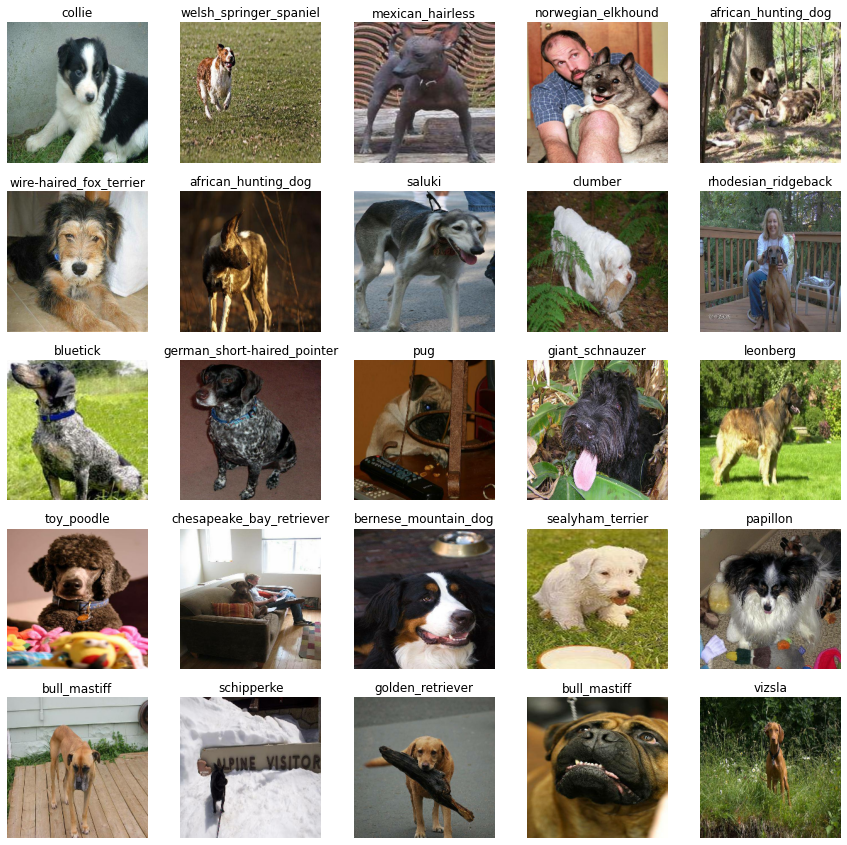

In [ ]:
#Now let's visulize the data in a training batch
show_25_images(train_images, train_labels)

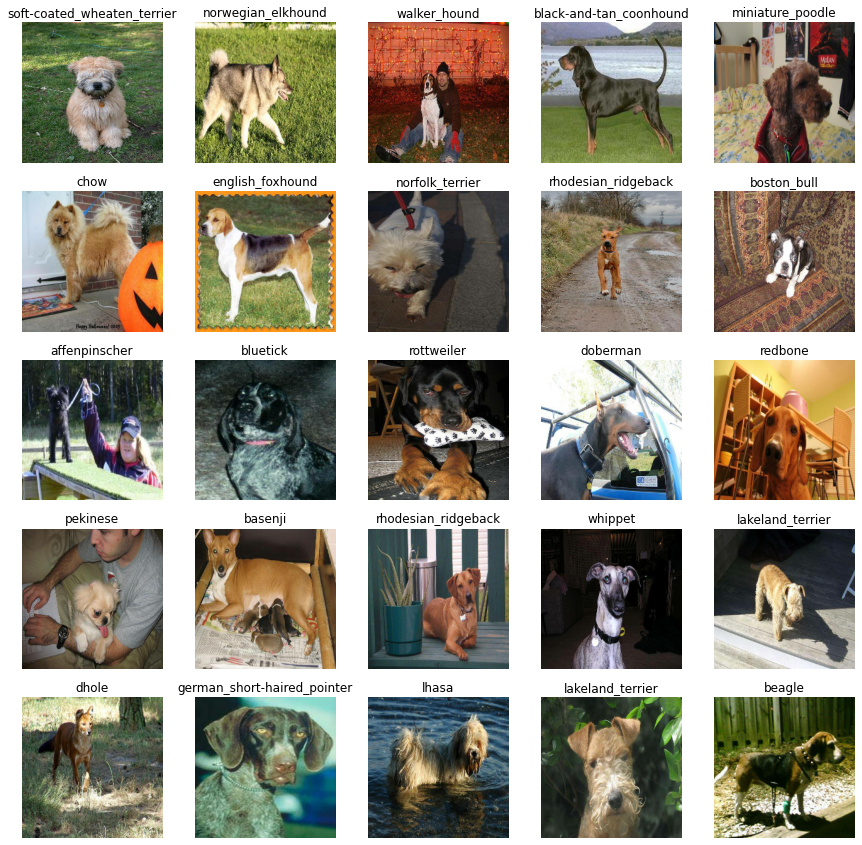

In [ ]:
#Now let's visulize the data in a validation data
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## buliding a model

Before we build a model, there are few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model_selection
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFLow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:

# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"



Now We've got our inputs, outputs and model ready to go.. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Return the model..


In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, 

  model_url=MODEL_URL):
  print('Building model with:',MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
                               hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation='softmax') # Layer 2 (output later)                      
                               
  ])


  # compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )


  # Build the model
  model.build(INPUT_SHAPE)
  
  return model

In [ ]:
# Create a model and check its details
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks

Callbacks are helper functions a model ca nuse during training to do such things as save its progress, check its progress or stop training early if model stops improving..


we'll create two callbacks, one for TensorBoard which helps track our model progress and another for early stopping which prevents oour model fromm training for too long..

### TensorBoard Callback

to setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension..
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with `%tensorboard` magic function (we'll do this after model training)..

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

#create a function to build a  TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        #Make it so the logs get tracked whenever we run as experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S")) 
  
  return  tf.keras.callbacks.TensorBoard(logdir)



### Early Stopping Callback

Eaarly stopping helps stop our model from overfitting by stopping training if a certian evaluation metrics stops improving

In [ ]:
# Create early stopping callbacks
early_Stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

#Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working perfectly..

In [ ]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running on a GPU
print('GPU', 'available (YESSSS!!!)' if tf.config.list_physical_devices('GPU') else 'not available :(')


GPU available (YESSSS!!!)


Let's create a function which trains a model

* Create a model using `create_mmodel()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  '''
  Train a given model and returns the trained versions.

  '''

  model = create_model()

  # Create new TensorBoard session everytime wee train a model
  tensorboard = create_tensorboard_callback()

  #fit the model to the data passing it the callbacks wee created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_Stopping])
  
  #return the fitted model
  return model

In [ ]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
50/50 [==============================] - 112s 1s/step - loss: 3.6455 - accuracy: 0.2475 - val_loss: 1.9021 - val_accuracy: 0.5600
Epoch 2/100
50/50 [==============================] - 9s 183ms/step - loss: 0.8461 - accuracy: 0.8306 - val_loss: 1.1507 - val_accuracy: 0.7050
Epoch 3/100
50/50 [==============================] - 8s 158ms/step - loss: 0.3199 - accuracy: 0.9613 - val_loss: 0.9931 - val_accuracy: 0.7375
Epoch 4/100
50/50 [==============================] - 7s 136ms/step - loss: 0.1696 - accuracy: 0.9894 - val_loss: 0.9372 - val_accuracy: 0.7425
Epoch 5/100
50/50 [==============================] - 7s 138ms/step - loss: 0.1085 - accuracy: 0.9962 - val_loss: 0.9064 - val_accuracy: 0.7525
Epoch 6/100
50/50 [==============================] - 8s 159ms/step - loss: 0.0752 - accuracy: 1.0000 - val_loss: 0.8848 - val_accuracy: 0.7575
Epoch 7/100
50/50 [==============================]

### Checking the tensorboard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

# Making and evaluation prediction using trained model

In [ ]:
# make pprediction on the validation data (not used to train on)

prediction = model.predict(val_data, verbose=1)
prediction

8/8 [==============================] - 3s 358ms/step


array([[7.1952767e-05, 2.6701579e-07, 4.9124951e-06, ..., 5.0359049e-05,
        3.1570066e-04, 7.5449120e-06],
       [9.7682445e-05, 4.8872021e-06, 4.7349800e-05, ..., 2.0578437e-07,
        6.5142623e-05, 4.0912939e-05],
       [1.7232015e-03, 1.2731136e-04, 8.5211301e-05, ..., 3.3896495e-04,
        1.3228086e-03, 7.5123891e-02],
       ...,
       [2.8852898e-07, 5.3359372e-06, 2.5369520e-05, ..., 1.8432498e-05,
        7.6935021e-04, 1.4881563e-07],
       [4.0848861e-03, 2.1267658e-04, 1.0105731e-05, ..., 1.4959973e-04,
        1.7554929e-02, 1.2316560e-02],
       [1.9089573e-05, 5.0250515e-02, 1.1723422e-05, ..., 2.4336736e-05,
        1.7615961e-04, 1.0713660e-03]], dtype=float32)

In [ ]:
prediction.shape

(1000, 120)

In [ ]:
len(y_val)

1000

In [ ]:
# First Prediction
index = 42
print(prediction[index])
print(f'Max value (probability of prediction): {np.max(prediction[index])}')
print(f'Sum: {np.sum(prediction[index])}')
print(f'max index: {np.argmax(prediction[index])}')
print(f'predicted label: {unique_breeds[np.argmax(prediction[index])]}')

[3.88596760e-04 2.88702495e-06 6.50198344e-05 6.12302756e-06
 4.20263037e-04 9.76418414e-06 1.36210234e-03 4.07816042e-05
 1.21439443e-04 3.89993074e-05 1.00768702e-05 1.34031879e-05
 1.36715962e-05 1.15894181e-05 2.05564247e-05 1.88865506e-05
 3.62908722e-05 1.26813063e-02 8.11878272e-06 3.47454508e-04
 8.96616766e-05 9.11211609e-05 9.09749826e-04 8.58389467e-05
 9.00204395e-06 6.94931850e-06 5.22774518e-01 2.19960930e-03
 3.93147957e-06 9.26461478e-04 3.46129294e-04 3.21494772e-05
 4.55308909e-05 3.32696509e-05 2.41430803e-06 9.25875735e-04
 4.56325070e-04 1.03908817e-04 1.01768914e-04 1.72486798e-05
 2.06157147e-05 3.51312920e-04 7.83084834e-05 2.19819995e-04
 2.56791664e-05 9.77506279e-04 2.90089258e-04 7.59326667e-06
 1.15904295e-04 6.75516276e-06 2.89719028e-05 3.88304798e-05
 5.16014006e-06 2.21692550e-04 5.70230877e-05 1.02756785e-05
 1.37962270e-04 1.07207961e-04 4.02977967e-05 3.94982315e-04
 6.55186932e-06 2.09462760e-05 4.58539180e-05 1.18673488e-04
 2.85929476e-04 4.558806

Having the above functionality is great but we want tobe able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence level

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  '''
  Turn an array of a prediction probabilities into label
  '''

  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array o prediction probabilities
pred_label = get_pred_label(prediction[9])
pred_label


'ibizan_hound'

Now Since our validation data is still in a batch dataset..
we'll have to unbatchify it to make predictions on the vvalidation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
#create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.08661207, 0.09751292, 0.07815619],
         [0.06751302, 0.0918505 , 0.05747823],
         [0.0604112 , 0.09729353, 0.04384629],
         ...,
         [0.83837754, 0.8455904 , 0.79945946],
         [0.7929071 , 0.7970798 , 0.7295842 ],
         [0.8214812 , 0.826038  , 0.75354415]],
 
        [[0.07184874, 0.09509204, 0.08496422],
         [0.06569613, 0.096114  , 0.0656529 ],
         [0.04666601, 0.09603959, 0.03923428],
         ...,
         [0.74699265, 0.75564605, 0.6929895 ],
         [0.72310936, 0.73635286, 0.6507261 ],
         [0.75028026, 0.76419234, 0.67546123]],
 
        [[0.04185049, 0.07891282, 0.07907913],
         [0.03230042, 0.08288307, 0.05734802],
         [0.02757026, 0.09470031, 0.03129049],
         ...,
         [0.65601474, 0.67997307, 0.56799006],
         [0.6598779 , 0.6838362 , 0.57188773],
         [0.68698364, 0.710942  , 0.5989934 ]],
 
        ...,
 
        [[0.326806  , 0.42850253, 0.31729966],
         [0.6370607 , 0.7247883 , 0.66578

Now we've got ways to get:
* Predition labels
* Validation labels (truth Labels)
* Validation Images

Let's make some function to make these all a bit more visualize.



In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

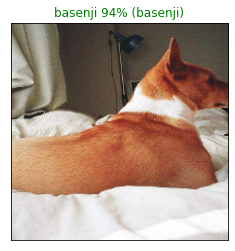

In [ ]:
plot_pred(prediction_probabilities=prediction, labels=val_labels, images=val_images, n=88)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

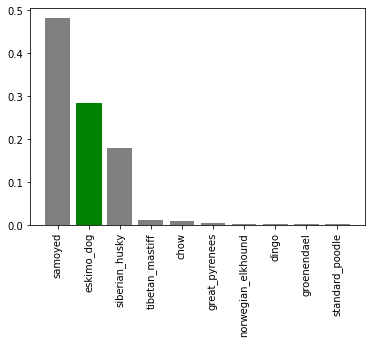

In [ ]:
plot_pred_conf(prediction_probabilities=prediction,
               labels=val_labels,
               n=102)



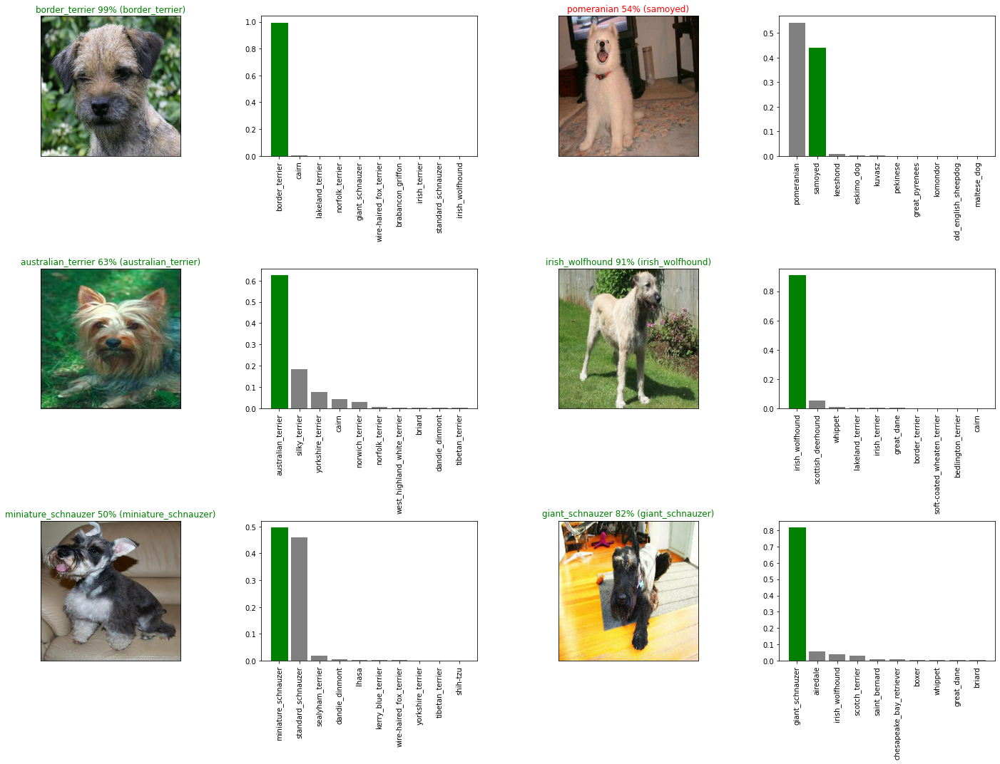

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=prediction,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=prediction,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving model

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path



In [ ]:
# create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="5000-images-mobilenetv2-Adam")



Saving model to: drive/MyDrive/Dog Vision/models/20220702-09471656755275-5000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20220702-09471656755275-5000-images-mobilenetv2-Adam.h5'

In [ ]:
#load a trained model
loaded_5000_images_model = load_model('/content/drive/MyDrive/Dog Vision/models/20220702-09471656755275-5000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20220702-09471656755275-5000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

8/8 [==============================] - 3s 350ms/step - loss: 0.6869 - accuracy: 0.8000


[0.6868694424629211, 0.800000011920929]

In [ ]:
#evaluate the loaded model 
loaded_5000_images_model.evaluate(val_data)

8/8 [==============================] - 5s 543ms/step - loss: 0.6869 - accuracy: 0.8000


[0.6868694424629211, 0.800000011920929]

## Training aa big dog model (on the full data)

In [ ]:
len(x), len(y)

(10222, 10222)

In [ ]:
# create a data batch with full data set
full_data = create_data_batches(x,y)

Creating Training data batches...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# no validation set when training on all the data, so we can not monitoe validation accuracy 
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

In [ ]:
#fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
80/80 [==============================] - 41s 452ms/step - loss: 1.9699 - accuracy: 0.5538
Epoch 2/100
80/80 [==============================] - 34s 426ms/step - loss: 0.5447 - accuracy: 0.8476
Epoch 3/100
80/80 [==============================] - 40s 502ms/step - loss: 0.3681 - accuracy: 0.9023
Epoch 4/100
80/80 [==============================] - 36s 451ms/step - loss: 0.2690 - accuracy: 0.9347
Epoch 5/100
80/80 [==============================] - 35s 431ms/step - loss: 0.2077 - accuracy: 0.9547
Epoch 6/100
80/80 [==============================] - 35s 436ms/step - loss: 0.1644 - accuracy: 0.9692
Epoch 7/100
80/80 [==============================] - 36s 448ms/step - loss: 0.1331 - accuracy: 0.9781
Epoch 8/100
80/80 [==============================] - 36s 444ms/step - loss: 0.1108 - accuracy: 0.9845
Epoch 9/100
80/80 [==============================] - 37s 459ms/step - loss: 0.0940 - accuracy: 0.9878
Epoch 10/100
80/80 [==============================] - 36s 446ms/step - loss: 0.080

In [ ]:
# Save model to file
save_model(full_model, suffix="full-images-set-mobilenetv3-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20220702-10071656756446-full-images-set-mobilenetv3-Adam.h5...


'drive/MyDrive/Dog Vision/models/20220702-10071656756446-full-images-set-mobilenetv3-Adam.h5'

In [ ]:
loaded_full_model = load_model('/content/drive/MyDrive/Dog Vision/models/20220411-06111649657496-full-images-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20220411-06111649657496-full-images-set-mobilenetv2-Adam.h5


## Making prediction on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames.
* Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since there are no labels with the test images).
* Make a predictions array by passing the test data batches to the predict() function.


In [ ]:
#load test images filenames
test_path = '/content/drive/MyDrive/Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/test/e4cffb02169d9b46810d50c6b9eae28d.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e70ffd525a15ed3eb30a8c25869bc755.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e5fa615e36dc3b2b3f554aa5097a6ece.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e34654831e228ad3ac1d0c463e70caf6.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e1967a2e9c507c256b83a1e2e4f4e941.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e55534e27f92b4c8177ed2beb1cbba7b.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e07e608afaa89ee4ee939ad0a3bd3224.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e4e71046e4dce90d4b4790e9819d2d82.jpg',
 '/content/drive/MyDrive/Dog Vision/test/dfa54e85c1309d8a9933deedc1d775c7.jpg',
 '/content/drive/MyDrive/Dog Vision/test/dd539ec1933bc47bc80b1447a26aef45.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)



Creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)



324/324 [==============================] - 212s 616ms/step


In [ ]:
#save the predictions (Numpy Array) to csv file (for access later)
np.savetxt('drive/MyDrive/Dog Vision/preds_array.csv', test_predictions, delimiter=',')

In [ ]:
#Load predictions (Numpy Array) from csv file
test_predictions = np.loadtxt('drive/MyDrive/Dog Vision/preds_array.csv', delimiter=',')

In [ ]:
test_predictions[:10]

array([[1.75041318e-11, 9.69488601e-10, 1.49883545e-12, ...,
        8.00061545e-11, 8.32740404e-11, 1.04260357e-10],
       [1.42404144e-09, 1.76045678e-09, 2.35194807e-06, ...,
        1.54621681e-04, 3.58103014e-09, 4.69504869e-07],
       [9.28366717e-09, 2.34312791e-09, 7.52979972e-08, ...,
        7.03469198e-07, 3.26534803e-07, 3.28221563e-06],
       ...,
       [3.65681041e-09, 3.21979970e-10, 9.99070049e-10, ...,
        1.43545993e-12, 6.63893116e-12, 8.05605360e-10],
       [4.04157527e-06, 3.71557303e-06, 1.00245001e-09, ...,
        4.76705564e-10, 8.39747827e-09, 6.56865318e-09],
       [2.82580913e-06, 4.03794900e-08, 4.88865872e-08, ...,
        1.70242984e-07, 2.27919131e-07, 7.35708170e-07]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, it looks like they want the models output probabilities each for label along with the image ID's.

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns using the unique_breeds list and the test_predictions list.
* Export the DataFrame as a CSV to submit it to Kaggle.



In [ ]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_path = "drive/My Drive/Dog Vision/test/"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()



,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e4cffb02169d9b46810d50c6b9eae28d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e70ffd525a15ed3eb30a8c25869bc755,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e5fa615e36dc3b2b3f554aa5097a6ece,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e34654831e228ad3ac1d0c463e70caf6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e1967a2e9c507c256b83a1e2e4f4e941,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()



,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e4cffb02169d9b46810d50c6b9eae28d,1.750413e-11,9.694886e-10,1.498835e-12,3.524319e-10,3.132079e-13,3.435601e-13,3.966645e-12,3.140130e-13,4.015080e-12,...,4.207447e-08,8.210893e-12,7.512729e-11,2.688074e-09,1.876847e-12,2.325684e-11,3.580258e-12,8.000615e-11,8.327404e-11,1.042604e-10
1,e70ffd525a15ed3eb30a8c25869bc755,1.424041e-09,1.760457e-09,2.351948e-06,4.911253e-08,7.552358e-07,4.504990e-07,1.169996e-09,1.051373e-04,1.954370e-08,...,1.020090e-05,1.200586e-01,6.219854e-08,5.466622e-06,2.076836e-08,1.642141e-09,5.716885e-09,1.546217e-04,3.581030e-09,4.695049e-07
2,e5fa615e36dc3b2b3f554aa5097a6ece,9.283667e-09,2.343128e-09,7.529800e-08,3.281766e-09,6.928236e-06,4.497233e-09,1.219786e-06,4.084887e-04,2.075378e-05,...,1.682349e-03,2.445092e-05,1.039529e-08,1.217659e-10,4.001223e-07,4.190412e-07,4.123929e-08,7.034692e-07,3.265348e-07,3.282216e-06
3,e34654831e228ad3ac1d0c463e70caf6,4.820931e-10,1.274299e-11,2.254300e-09,4.739921e-10,9.789659e-01,4.361103e-09,1.273534e-07,7.138842e-07,5.749227e-09,...,4.443553e-07,5.631189e-10,1.482601e-07,2.403384e-07,1.580746e-10,2.477914e-10,7.507150e-09,1.678038e-05,6.075793e-08,1.550302e-09
4,e1967a2e9c507c256b83a1e2e4f4e941,1.206702e-08,3.225113e-11,1.897941e-09,1.260926e-08,8.945313e-05,6.610485e-08,1.803992e-09,5.519838e-10,5.308521e-07,...,3.428125e-09,2.263589e-09,9.501645e-01,3.240270e-06,1.959903e-06,3.390771e-10,4.291231e-12,1.852444e-06,4.574277e-09,2.204561e-10


In [ ]:
# save our predictions dataframe to csv for submission to Kaggle
preds_df.to_csv('drive/MyDrive/Dog Vision/full_model_predicitions_submission_mobilenetv2.csv',
                index=False)